In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import matplotlib.image as mpimg
import plotly.offline as pyo
pyo.init_notebook_mode()
import os
import PIL
import PIL.Image
import pathlib
import cv2

In [17]:
data=pd.read_csv('/kaggle/input/fashion-product-images-dataset/fashion-dataset/images.csv')
data

,filename,link
0,15970.jpg,http://assets.myntassets.com/v1/images/style/p...
1,39386.jpg,http://assets.myntassets.com/v1/images/style/p...
2,59263.jpg,http://assets.myntassets.com/v1/images/style/p...
3,21379.jpg,http://assets.myntassets.com/v1/images/style/p...
4,53759.jpg,http://assets.myntassets.com/v1/images/style/p...
...,...,...
44441,17036.jpg,http://assets.myntassets.com/v1/images/style/p...
44442,6461.jpg,http://assets.myntassets.com/v1/images/style/p...
44443,18842.jpg,http://assets.myntassets.com/v1/images/style/p...
44444,46694.jpg,http://assets.myntassets.com/v1/images/style/p...


In [18]:
styles_df=pd.read_csv('/kaggle/input/fashion-product-images-dataset/fashion-dataset/styles.csv',on_bad_lines='skip')

In [19]:
DATASET_PATH = '/kaggle/input/fashion-product-images-dataset/fashion-dataset/fashion-dataset'

print(os.listdir(DATASET_PATH))

['images.csv', 'images', 'styles.csv', 'styles']


In [20]:
styles_df.shape

(44424, 10)

In [21]:
images_df=pd.read_csv('/kaggle/input/fashion-product-images-dataset/fashion-dataset/images.csv')
images_df.shape

(44446, 2)

In [22]:
styles_df.head(10)

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt
5,1855,Men,Apparel,Topwear,Tshirts,Grey,Summer,2011.0,Casual,Inkfruit Mens Chain Reaction T-shirt
6,30805,Men,Apparel,Topwear,Shirts,Green,Summer,2012.0,Ethnic,Fabindia Men Striped Green Shirt
7,26960,Women,Apparel,Topwear,Shirts,Purple,Summer,2012.0,Casual,Jealous 21 Women Purple Shirt
8,29114,Men,Accessories,Socks,Socks,Navy Blue,Summer,2012.0,Casual,Puma Men Pack of 3 Socks
9,30039,Men,Accessories,Watches,Watches,Black,Winter,2016.0,Casual,Skagen Men Black Watch


In [23]:
images_df.head(10)

,filename,link
0,15970.jpg,http://assets.myntassets.com/v1/images/style/p...
1,39386.jpg,http://assets.myntassets.com/v1/images/style/p...
2,59263.jpg,http://assets.myntassets.com/v1/images/style/p...
3,21379.jpg,http://assets.myntassets.com/v1/images/style/p...
4,53759.jpg,http://assets.myntassets.com/v1/images/style/p...
5,1855.jpg,http://assets.myntassets.com/v1/images/style/p...
6,30805.jpg,http://assets.myntassets.com/v1/images/style/p...
7,26960.jpg,http://assets.myntassets.com/v1/images/style/p...
8,29114.jpg,http://assets.myntassets.com/v1/images/style/p...
9,30039.jpg,http://assets.myntassets.com/v1/images/style/p...


**Gender Distribution**

In [24]:
print(styles_df.gender.unique())

['Men' 'Women' 'Boys' 'Girls' 'Unisex']


In [25]:
print(styles_df.gender.value_counts())

gender
Men       22147
Women     18631
Unisex     2161
Boys        830
Girls       655
Name: count, dtype: int64


In [26]:
fig = px.pie(styles_df, styles_df['gender'],color='gender',color_discrete_map={'Men':'darkblue',
                                 'Women':'royalblue',
                                 'Unisex':'cyan',
                                 'Boys':'lightcyan',
                                 'Girls':'lightblue'})
fig.show()

****Master Category Distribution****

In [27]:
macount = pd.value_counts(styles_df['masterCategory'])
macount

<ipython-input-27-7f45bbdc6120>:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



masterCategory
Apparel           21397
Accessories       11274
Footwear           9219
Personal Care      2403
Free Items          105
Sporting Goods       25
Home                  1
Name: count, dtype: int64

In [28]:
macount = styles_df['masterCategory'].value_counts().reset_index()
macount.columns = ["masterCategory", "count"]  # Rename columns properly

fig = px.bar(macount, x="masterCategory", y="count", color="masterCategory",
             labels={"masterCategory": "Master Category", "count": "Count"})
fig.show()


****Subcategory Distribution****

In [29]:
subcount=pd.value_counts(styles_df['subCategory'])
subcount

<ipython-input-29-3ebba5a8daa2>:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



subCategory
Topwear                     15402
Shoes                        7343
Bags                         3055
Bottomwear                   2694
Watches                      2542
Innerwear                    1808
Jewellery                    1079
Eyewear                      1073
Fragrance                    1011
Sandal                        963
Wallets                       933
Flip Flops                    913
Belts                         811
Socks                         698
Lips                          527
Dress                         478
Loungewear and Nightwear      470
Saree                         427
Nails                         329
Makeup                        307
Headwear                      293
Ties                          258
Accessories                   129
Scarves                       118
Cufflinks                     108
Apparel Set                   106
Free Gifts                    104
Stoles                         90
Skin Care                      77
Sk

In [30]:
subcount = styles_df['subCategory'].value_counts().reset_index()
subcount.columns = ["subCategory", "count"]  # Rename columns properly

fig = px.bar(subcount, x="subCategory", y="count", color="subCategory",
             labels={"subCategory": "Sub Category", "count": "Count"})
fig.show()


****Article Type Distribution****

In [31]:
arcount=pd.value_counts(styles_df['articleType'])
arcount

<ipython-input-31-f721136fd854>:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



articleType
Tshirts                7067
Shirts                 3217
Casual Shoes           2845
Watches                2542
Sports Shoes           2036
                       ... 
Body Wash and Scrub       1
Shoe Laces                1
Hair Accessory            1
Suits                     1
Ipad                      1
Name: count, Length: 143, dtype: int64

In [32]:
arcount = styles_df['articleType'].value_counts().reset_index()
arcount.columns = ["articleType", "count"]  # Rename columns

fig = px.bar(arcount, x="articleType", y="count", color="articleType",
             labels={"articleType": "Article Type", "count": "Count"})
fig.show()


**Base Colour Distribution**

In [33]:
basecount=pd.value_counts(styles_df['baseColour'])
basecount

<ipython-input-33-43e5059b5e33>:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



baseColour
Black                9728
White                5538
Blue                 4918
Brown                3494
Grey                 2741
Red                  2455
Green                2115
Pink                 1860
Navy Blue            1789
Purple               1640
Silver               1090
Yellow                778
Beige                 749
Gold                  628
Maroon                581
Orange                530
Olive                 410
Multi                 394
Cream                 390
Steel                 315
Charcoal              228
Peach                 195
Off White             182
Skin                  179
Lavender              162
Grey Melange          146
Khaki                 139
Magenta               129
Teal                  120
Tan                   114
Mustard                97
Bronze                 95
Copper                 86
Turquoise Blue         69
Rust                   66
Burgundy               45
Metallic               43
Coffee Brown           31
M

In [34]:
basecount = styles_df['baseColour'].value_counts().reset_index()
basecount.columns = ["baseColour", "count"]  # Rename columns

fig = px.bar(basecount, x="baseColour", y="count", color="baseColour",
             labels={"baseColour": "Base Colour", "count": "Count"})
fig.show()


**Season Distribution**

In [35]:
secount=pd.value_counts(styles_df['season'])
secount

<ipython-input-35-f49e4f786b83>:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



season
Summer    21472
Fall      11431
Winter     8517
Spring     2983
Name: count, dtype: int64

In [36]:
secount = styles_df['season'].value_counts().reset_index()
secount.columns = ["season", "count"]  # Rename columns properly

fig = px.bar(secount, x="season", y="count", color="season",
             labels={"season": "Season", "count": "Count"})
fig.show()


**Image Data**

In [37]:
data_dir = pathlib.Path(DATASET_PATH)

images = list(data_dir.glob('*/*.jpg'))

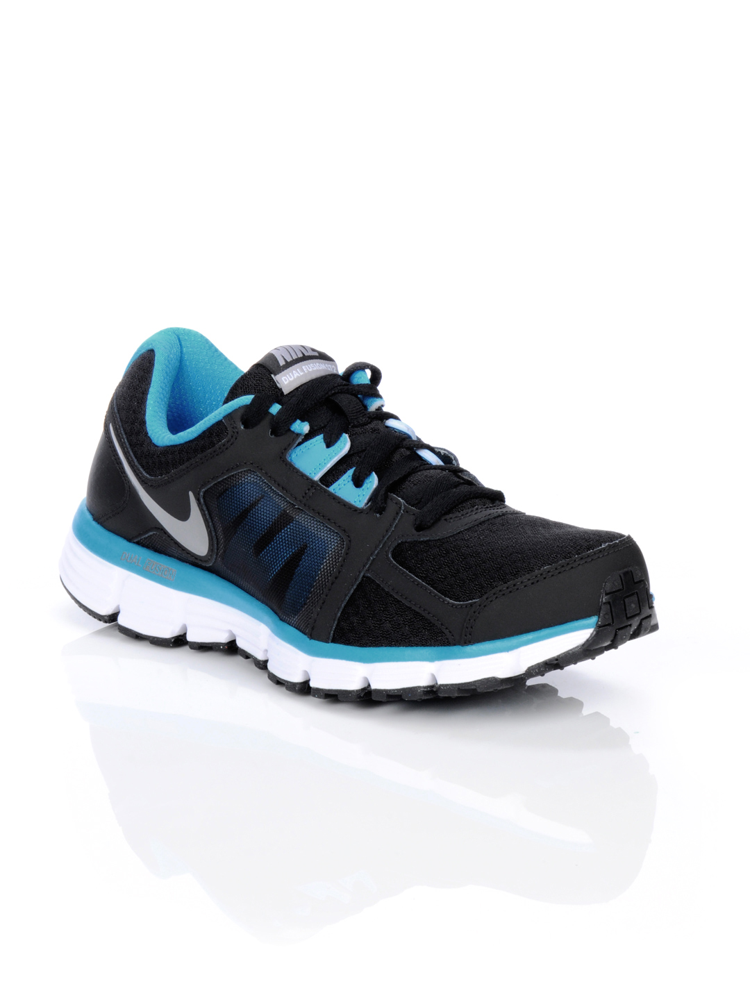

In [38]:
PIL.Image.open(str(images[0]))

In [39]:
styles_df['image'] = styles_df.apply(lambda row: os.path.join(DATASET_PATH, 'images', str(row['id']) + ".jpg"), axis=1)
styles_df.head()

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,image
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt,/kaggle/input/fashion-product-images-dataset/f...
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans,/kaggle/input/fashion-product-images-dataset/f...
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch,/kaggle/input/fashion-product-images-dataset/f...
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants,/kaggle/input/fashion-product-images-dataset/f...
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt,/kaggle/input/fashion-product-images-dataset/f...


In [40]:
def load_image(img_path, resized_fac = 0.1):
    img_object = plt.imread(img_path)
    w, h, c = img_object.shape
    resized = cv2.resize(img_object, (int(h*resized_fac), int(w*resized_fac)))
    return resized

In [41]:
def plot_grid(image_list, group):
    fig = plt.figure(figsize=(40, 10),facecolor="#D7DBDD")
    plt.suptitle(group, fontsize=40)
    
    samples = len(image_list)
    
    for i in range(samples):
        ax = plt.subplot(1, 4, i + 1)
        plt.imshow(load_image(image_list[i][0]))
        plt.title(image_list[i][1], fontsize=8)
        plt.axis("off")
    plt.show()  

In [42]:
def plot_grouped_images(dataframe, column, samples=4):
    groups = dataframe[column].unique()
    grouped_dataframe = dataframe.groupby(column)
    
    for group in groups:
        
        try:
            image_list = grouped_dataframe.get_group(group).sample(samples)[['image', 'productDisplayName']].values
            plot_grid(image_list, group)
        except:
            image_list = grouped_dataframe.get_group(group).sample(1)[['image', 'productDisplayName']].values
            plot_grid(image_list, group)

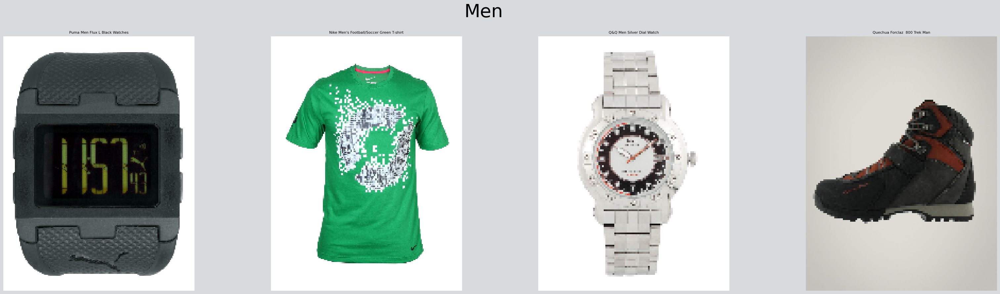

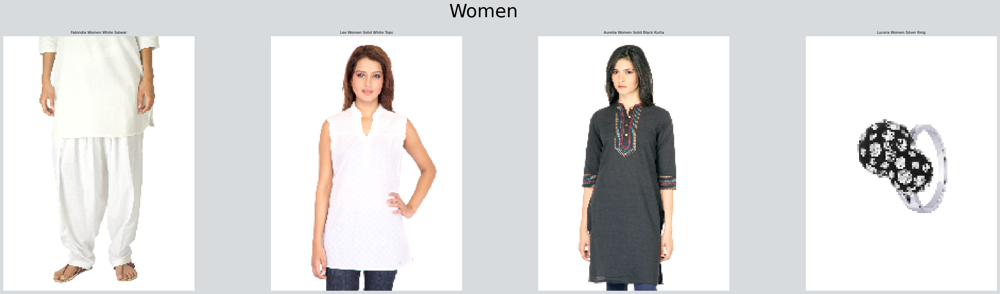

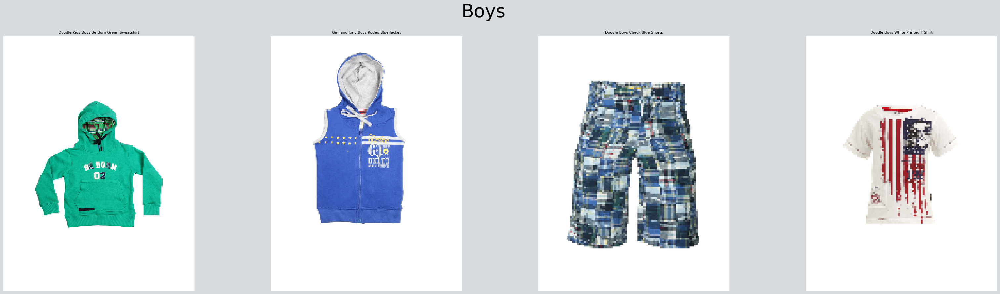

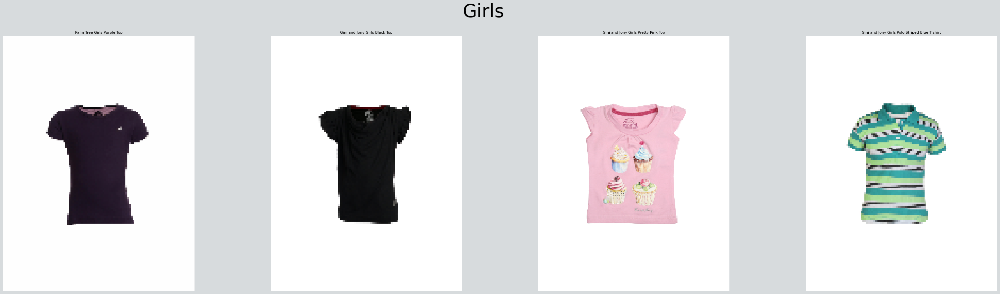

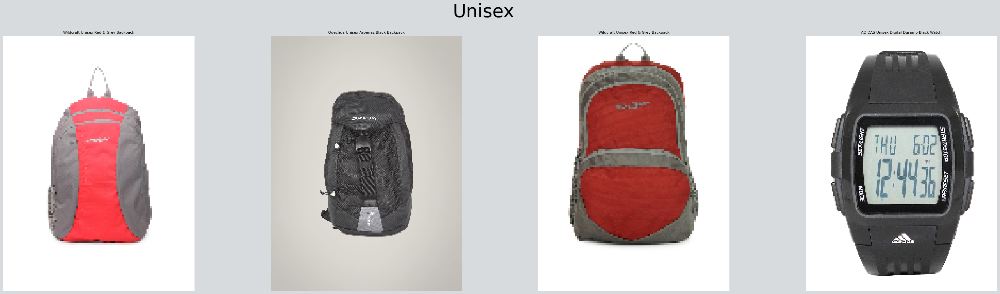

In [43]:
plot_grouped_images(styles_df, 'gender')

**Data Preprocessing**

In [44]:
from keras.callbacks import ModelCheckpoint
def create_tensorboard_callback(dir_name, experiment_name):
  log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  tensorboard_callback = tf.keras.callbacks.TensorBoard(
      log_dir=log_dir
  )
  print(f"Saving TensorBoard log files to: {log_dir}")
  return tensorboard_callback

In [45]:
def plot_loss_curves(history):
   
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()
# Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

In [46]:
import tensorflow as tf
import datetime
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.applications import ResNet50V2,EfficientNetB4

In [47]:
early_stopping = tf.keras.callbacks.EarlyStopping( monitor="val_loss",
    patience=5,
    mode="min",
)

In [48]:
train_datagen=ImageDataGenerator(rescale=1./255, validation_split = 0.3,)

In [49]:
BATCH_SIZE = 32

train_dataset = train_datagen.flow_from_dataframe(styles_df, 
                                                    x_col='image', 
                                                    y_col='articleType',
                                                    target_size=(224,224),
                                                    batch_size=BATCH_SIZE ,
                                                    subset = 'training',
                                                    class_mode='categorical')
val_dataset = train_datagen.flow_from_dataframe(styles_df,  
                                                x_col='image', 
                                                y_col='articleType',
                                                target_size=(224,224),
                                                batch_size=BATCH_SIZE ,
                                                subset = 'validation',
                                                class_mode='categorical')

Found 31094 validated image filenames belonging to 142 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning:

Found 5 invalid image filename(s) in x_col="image". These filename(s) will be ignored.



Found 13325 validated image filenames belonging to 142 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning:

Found 5 invalid image filename(s) in x_col="image". These filename(s) will be ignored.



In [50]:
dic_type=train_dataset.class_indices
lis_type=list(dic_type.keys())

**Residual Network (ResNet) is a Convolutional Neural Network (CNN) architecture that overcame the “vanishing gradient” problem, making it possible to construct networks with up to thousands of convolutional layers, which outperform shallower networks. Although ResNet has 3.8x more parameters and FLOPs than EfficeintNet with the same accuracy, the ResNet model requires 2.3x less memory and runs ~3x faster on TPUs and GPUs. We use ResNet50V2 model which has size 98MB, Top-1 accuracy is 76 percent and Top-5 accuracy is 93 percent on the ImageNet Dataset,25.6 million parameters,depth is 103 etc it is updated version of resnet50 model which gives higher accuracy. We also tried EfficientNetB4 on our dataset but that not work on our model and give validation accuarcy of 0.15 after running of 2 epochs.**

In [51]:
num_classes=142
res = ResNet50V2(input_shape = (224,224,3), weights = 'imagenet', include_top = False)
for layer in res.layers:
     layer.trainable = False
x = Flatten()(res.output)
x = Dense(128, activation = 'relu')(x) 
x = Dense(64, activation = 'relu')(x) 
x = Dense(num_classes, activation = 'softmax')(x) 
model = Model(inputs = res.input, outputs = x)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [52]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_conv[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_bn    │ (None, 56, 56, 64)     │            256 │ pool1_pool[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_relu  │ (None, 56, 56, 64)     │              0 │ conv2_block1_preact_b… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,096 │ conv2_block1_preact_r… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_pad        │ (None, 58, 58, 64)     │              0 │ conv2_block1_1_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,864 │ conv2_block1_2_pad[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_preact_r… │
│ (Conv2D)             

 Total params: 36,427,470 (138.96 MB)

 Trainable params: 12,862,670 (49.07 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

In [53]:
SAVE_DIR = "./logs"  # Define SAVE_DIR

res_history = model.fit(
    train_dataset,
    epochs=10,
    steps_per_epoch=len(train_dataset),
    validation_data=val_dataset,
    validation_steps=len(val_dataset),
    callbacks=[create_tensorboard_callback(dir_name=SAVE_DIR, 
                                           experiment_name="resnet50v2_model"),
               early_stopping]
)


In [54]:
def plot_loss_curves(history):
    """Plots training and validation loss curves."""
    loss = history.history['loss']
    val_loss = history.history.get('val_loss', [])  # Use `.get()` to avoid KeyError

    epochs = range(len(loss))  # Use actual training epoch count

    plt.plot(epochs, loss, label='training_loss')
    
    # Ensure `val_loss` is not empty and matches `epochs`
    if len(val_loss) == len(loss):
        plt.plot(epochs, val_loss, label='val_loss')
    else:
        plt.plot(range(len(val_loss)), val_loss, label='val_loss')

    plt.title('Loss Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


In [55]:
plot_loss_curves(res_history)

In [56]:
model.save("resnet50v2_model.h5")  # Save in .h5 format

In [57]:
from tensorflow.keras.models import load_model
model = load_model("/kaggle/input/resnet50v3/tensorflow2/default/1/resnet50v2_model.h5")


In [58]:
model.evaluate(val_dataset)

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



417/417 ━━━━━━━━━━━━━━━━━━━━ 460s 1s/step - accuracy: 0.8373 - loss: 0.7814


[0.798297107219696, 0.8327204585075378]

**Testing some images taken from amazon**

In [59]:
def load_and_prep_image(filename, img_shape=224):
  
  img = tf.io.read_file(filename)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.resize(img, size = [img_shape, img_shape])
  img = img/255.
  return img

In [60]:
def pred_and_plot(model, filename,class_names):
  img = load_and_prep_image(filename)

  # Make a prediction
  pred = model.predict(tf.expand_dims(img, axis=0))
  if len(pred[0]) > 1: # check for multi-class
    pred_class = class_names[pred.argmax()] # if more than one output, take the max
  else:
    pred_class = class_names[int(tf.round(pred)[0][0])]
# Plot the image and predicted value
  plt.imshow(img)
  plt.title(f"Prediction: {pred_class}")
  plt.axis(False);

In [61]:
filename='/kaggle/input/screenshotfrom-amazon/Screenshot 2023-04-17 at 11.28.20 AM.png'

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


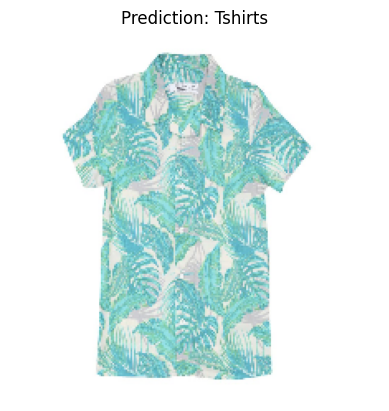

In [62]:
pred_and_plot(model,filename,lis_type)

**Colour Prediction**

In [63]:
print(styles_df["baseColour"].dtype)
print(styles_df["baseColour"].unique())  # Show unique values

object
['Navy Blue' 'Blue' 'Silver' 'Black' 'Grey' 'Green' 'Purple' 'White'
 'Beige' 'Brown' 'Bronze' 'Teal' 'Copper' 'Pink' 'Off White' 'Maroon'
 'Red' 'Khaki' 'Orange' 'Coffee Brown' 'Yellow' 'Charcoal' 'Gold' 'Steel'
 'Tan' 'Multi' 'Magenta' 'Lavender' 'Sea Green' 'Cream' 'Peach' 'Olive'
 'Skin' 'Burgundy' 'Grey Melange' 'Rust' 'Rose' 'Lime Green' 'Mauve'
 'Turquoise Blue' 'Metallic' 'Mustard' 'Taupe' 'Nude' 'Mushroom Brown' nan
 'Fluorescent Green']


In [64]:
styles_df = styles_df.dropna(subset=["baseColour"])  # Remove rows with missing labels

In [65]:
train_datagen=ImageDataGenerator(rescale=1./255, validation_split = 0.3)

In [66]:
BATCH_SIZE = 32

train_dataset_colour = train_datagen.flow_from_dataframe(styles_df, 
                                                    x_col='image', 
                                                    y_col='baseColour',
                                                    target_size=(224,224),
                                                    batch_size=BATCH_SIZE ,
                                                    subset = 'training',
                                                    class_mode='categorical')
val_dataset_colour = train_datagen.flow_from_dataframe(styles_df,  
                                                x_col='image', 
                                                y_col='baseColour',
                                                target_size=(224,224),
                                                batch_size=BATCH_SIZE ,
                                                subset = 'validation',
                                                class_mode='categorical')

Found 31083 validated image filenames belonging to 46 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning:

Found 5 invalid image filename(s) in x_col="image". These filename(s) will be ignored.



Found 13321 validated image filenames belonging to 46 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning:

Found 5 invalid image filename(s) in x_col="image". These filename(s) will be ignored.



In [67]:
dic_colour=train_dataset_colour.class_indices
lis_colour=list(dic_colour.keys())

In [68]:
num_classes= 46
res = ResNet50V2(input_shape = (224,224,3), weights = 'imagenet', include_top = False)
for layer in res.layers:
     layer.trainable = False
x = Flatten()(res.output)
x = Dense(128, activation = 'relu')(x) 
x = Dense(64, activation = 'relu')(x) 
x = Dense(num_classes, activation = 'softmax')(x) 
model_colour = Model(inputs = res.input, outputs = x)
model_colour.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [69]:
SAVE_DIR = "./logs"
res_history_colour = model_colour.fit(train_dataset_colour,
                                  epochs=10,
                                  steps_per_epoch=len(train_dataset_colour),
                                  validation_data=val_dataset_colour,
                                  validation_steps=len(val_dataset_colour),
                                  callbacks=[create_tensorboard_callback(dir_name=SAVE_DIR, 
                                                                     experiment_name="resnet50v2_model_colour"),early_stopping]
                                 )

In [70]:
plot_loss_curves(res_history_colour)

In [71]:
model_colour.save("/kaggle/working/resnet50v2_model_colour.h5")


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


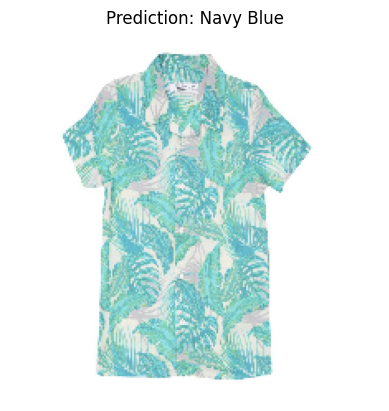

In [72]:
pred_and_plot(model_colour,filename,lis_colour)

In [73]:
print(styles_df["season"].dtype)
print(styles_df["season"].unique())  # Show unique values

object
['Fall' 'Summer' 'Winter' 'Spring' nan]


In [74]:
styles_df= styles_df.dropna(subset= ["season"])

In [75]:
BATCH_SIZE = 32

train_dataset_season = train_datagen.flow_from_dataframe(styles_df, 
                                                    x_col='image', 
                                                    y_col='season',
                                                    target_size=(224,224),
                                                    batch_size=BATCH_SIZE ,
                                                    subset = 'training',
                                                    class_mode='categorical')
val_dataset_season = train_datagen.flow_from_dataframe(styles_df,  
                                                x_col='image', 
                                                y_col='season',
                                                target_size=(224,224),
                                                batch_size=BATCH_SIZE ,
                                                subset = 'validation',
                                                class_mode='categorical')

Found 31069 validated image filenames belonging to 4 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning:

Found 5 invalid image filename(s) in x_col="image". These filename(s) will be ignored.



Found 13314 validated image filenames belonging to 4 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning:

Found 5 invalid image filename(s) in x_col="image". These filename(s) will be ignored.



In [76]:
dic_season=train_dataset_season.class_indices
lis_season=list(dic_season.keys())

In [77]:
num_classes = len(lis_season)
num_classes

4

In [78]:
res = ResNet50V2(input_shape = (224,224,3), weights = 'imagenet', include_top = False)
for layer in res.layers:
     layer.trainable = False
x = Flatten()(res.output)
x = Dense(128, activation = 'relu')(x) 
x = Dense(64, activation = 'relu')(x) 
x = Dense(num_classes, activation = 'softmax')(x) 
model_season = Model(inputs = res.input, outputs = x)
model_season.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [79]:
SAVE_DIR = "./logs"
res_history_season = model_season.fit(train_dataset_season,
                                  epochs=10,
                                  steps_per_epoch=len(train_dataset_season),
                                  validation_data=val_dataset_season,
                                  validation_steps=len(val_dataset_season),
                                  callbacks=[create_tensorboard_callback(dir_name=SAVE_DIR, 
                                                                     experiment_name="resnet50v2_model_season"),early_stopping]
                                 )

In [80]:
plot_loss_curves(res_history_season)

In [81]:
model_season.save("/kaggle/working/resnet50v2_model_season.h5")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


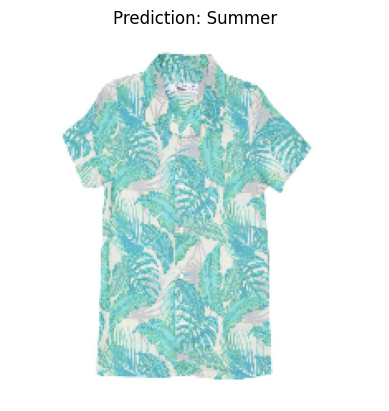

In [82]:
pred_and_plot(model_season,filename,lis_season)

**Gender Prediction**

In [83]:
print(styles_df["gender"].dtype)
print(styles_df["gender"].unique())  # Show unique values

object
['Men' 'Women' 'Boys' 'Girls' 'Unisex']


In [84]:
BATCH_SIZE = 32

train_dataset_gender = train_datagen.flow_from_dataframe(styles_df, 
                                                    x_col='image', 
                                                    y_col='gender',
                                                    target_size=(224,224),
                                                    batch_size=BATCH_SIZE ,
                                                    subset = 'training',
                                                    class_mode='categorical')
val_dataset_gender = train_datagen.flow_from_dataframe(styles_df,  
                                                x_col='image', 
                                                y_col='gender',
                                                target_size=(224,224),
                                                batch_size=BATCH_SIZE ,
                                                subset = 'validation',
                                                class_mode='categorical')

Found 31069 validated image filenames belonging to 5 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning:

Found 5 invalid image filename(s) in x_col="image". These filename(s) will be ignored.



Found 13314 validated image filenames belonging to 5 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning:

Found 5 invalid image filename(s) in x_col="image". These filename(s) will be ignored.



In [85]:
dic_gender=train_dataset_gender.class_indices
lis_gender=list(dic_gender.keys())

In [86]:
num_classes = len(lis_gender)
num_classes

5

In [87]:
res = ResNet50V2(input_shape = (224,224,3), weights = 'imagenet', include_top = False)
for layer in res.layers:
     layer.trainable = False
x = Flatten()(res.output)
x = Dense(128, activation = 'relu')(x) 
x = Dense(64, activation = 'relu')(x) 
x = Dense(num_classes, activation = 'softmax')(x) 
model_gender = Model(inputs = res.input, outputs = x)
model_gender.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [88]:
SAVE_DIR = "./logs"
res_history_gender = model_gender.fit(train_dataset_gender,
                                  epochs=10,
                                  steps_per_epoch=len(train_dataset_gender),
                                  validation_data=val_dataset_gender,
                                  validation_steps=len(val_dataset_gender),
                                  callbacks=[create_tensorboard_callback(dir_name=SAVE_DIR, 
                                                                     experiment_name="resnet50v2_model_gender"),early_stopping]
                                 )

In [89]:
plot_loss_curves(res_history_gender)

In [90]:
model_gender.save("/kaggle/working/resnet50v2_model_gender.h5")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


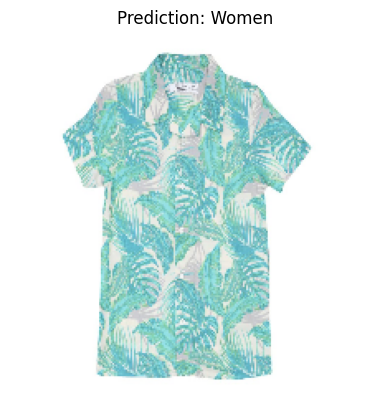

In [91]:
pred_and_plot(model_gender,filename,lis_gender)

In [92]:
filename_1='/kaggle/input/gents-shirt/71B4LQjxh6L._AC_SY550_.jpg'

In [93]:
from tensorflow.keras.models import load_model

# Load each trained model
model_season = load_model("/kaggle/input/season_model/tensorflow2/default/1/resnet50v2_model_season.h5")  # Predicts Season
model_gender = load_model("/kaggle/input/gender_model/tensorflow2/default/1/resnet50v2_model_gender.h5")  # Predicts Gender
model_type = load_model("/kaggle/input/resnet50v3/tensorflow2/default/1/resnet50v2_model.h5")      # Predicts Product Type
model_color = load_model("/kaggle/input/colour_model/tensorflow2/default/1/resnet50v2_model_colour.h5")    # Predicts Color


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


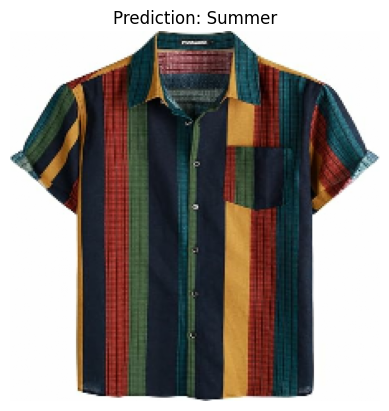

In [98]:
pred_and_plot(model_season,filename_1,lis_season)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


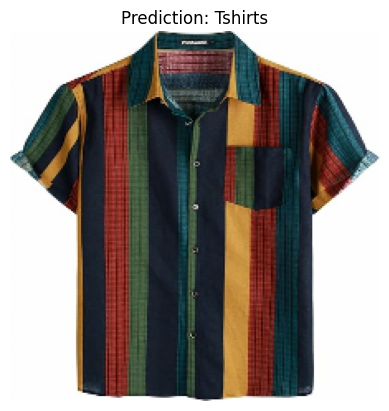

In [99]:
pred_and_plot(model_type,filename_1,lis_type)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


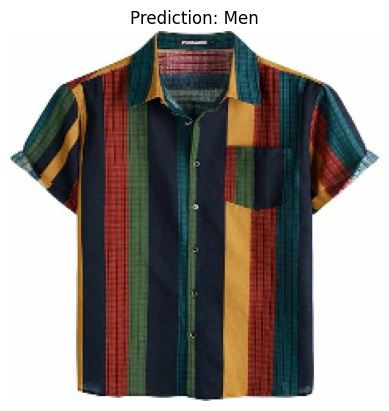

In [100]:
pred_and_plot(model_gender,filename_1,lis_gender)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


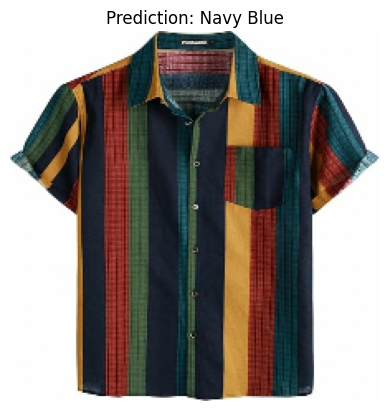

In [101]:
pred_and_plot(model_colour,filename_1,lis_colour)